In [30]:
import numpy as np
import librosa as lb
import os
import os.path
from pathlib import Path
import multiprocessing
import glob

In [31]:
ANNOTATIONS_ROOT = Path('train_data/beat')
AUDIO_ROOT = ('Full_Alignment_Recordings')
FEATURES_ROOT = Path('features')
Scenario_1_files = 'Full_Alignment_Recordings/Scenario_1'
Scenario_2_files = 'Full_Alignment_Recordings/Scenario_2'
Scenario_3_files = 'Full_Alignment_Recordings/Scenario_3'
Scenario_4_files = 'Full_Alignment_Recordings/Scenario_4'

In [32]:
scenario1files = glob.glob(Scenario_1_files + "/*")
scenario2files = glob.glob(Scenario_2_files + "/*")
scenario3files = glob.glob(Scenario_3_files + "/*")
scenario4files = glob.glob(Scenario_4_files + "/*")
inFiles = []
for file in scenario1files:
    inFiles.append(file)
for file in scenario2files:
    inFiles.append(file)
for file in scenario3files:
    inFiles.append(file)
for file in scenario4files:
    inFiles.append(file)

print(len(inFiles))

8


In [33]:
if not os.path.exists(FEATURES_ROOT):
    os.mkdir(FEATURES_ROOT)

### Compute features on clean audio

First we compute features on the audio.

In [34]:
def compute_chroma_single(infile, outfile, sr = 22050, hop_length=512):
    y, sr = lb.core.load(infile, sr = sr)
    # F = lb.feature.chroma_cens(y, sr=sr, hop_length=hop_length)
    F = lb.feature.chroma_cqt(y, sr=sr, hop_length=hop_length, norm=2)
    np.save(outfile, F)
    return

In [35]:
def compute_chroma_batch(filelist, outdir, n_cores):

    # prep inputs for parallelization
    inputs = []
    with open(filelist, 'r') as f:
        for line in f:
            relpath = line.strip()
            reldir, fileid = os.path.split(relpath)
            featdir = outdir / reldir
            featdir.mkdir(parents=True, exist_ok=True)
            featfile = (featdir / fileid).with_suffix('.npy')
            audiofile = relpath
            if os.path.exists(featfile):
                print(f"Skipping {featfile}")
            else:
                inputs.append((audiofile, featfile))

    # process files in parallel
    pool = multiprocessing.Pool(processes = n_cores)
    pool.starmap(compute_chroma_single, inputs)

    return

In [36]:
compute_chroma_batch(Path("cfg_files/scenario.txt"),Path("scenario_feat"), 4)

Skipping scenario_feat/Full_Alignment_Recordings/Scenario_1/full_align_matching_recording1.npy
Skipping scenario_feat/Full_Alignment_Recordings/Scenario_1/full_align_matching_recording2.npy
Skipping scenario_feat/Full_Alignment_Recordings/Scenario_2/full_align_non_matching_recording1.npy
Skipping scenario_feat/Full_Alignment_Recordings/Scenario_2/full_align_non_matching_recording2.npy
Skipping scenario_feat/Full_Alignment_Recordings/Scenario_3/full_align_M_Mid_misM_recordingA.npy
Skipping scenario_feat/Full_Alignment_Recordings/Scenario_3/full_align_M_Mid_misM_recordingB.npy
Skipping scenario_feat/Full_Alignment_Recordings/Scenario_4/full_align_NM_Mid_M_recordingA.npy
Skipping scenario_feat/Full_Alignment_Recordings/Scenario_4/full_align_NM_Mid_M_recordingB.npy


### Alignment

In [37]:
%matplotlib inline
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [38]:
import numpy as np
import matplotlib.pyplot as plt
import librosa as lb
import os.path
from pathlib import Path
import pickle
import multiprocessing
import time
import gc

In [39]:
%%cython
import numpy as np
cimport numpy as np
cimport cython

import sys
import time


DTYPE_INT32 = np.int32
ctypedef np.int32_t DTYPE_INT32_t

DTYPE_FLOAT = np.float64
ctypedef np.float64_t DTYPE_FLOAT_t

cdef DTYPE_FLOAT_t MAX_FLOAT = float('inf')

# careful, without bounds checking can mess up memory - also can't use negative indices I think (like x[-1])
@cython.boundscheck(False) # turn off bounds-checking for entire function
def DTW_Cost_To_AccumCostAndSteps(Cin, parameter):
    '''
    Inputs
        C: The cost Matrix
    '''


    '''
    Section for checking and catching errors in the inputs
    '''

    cdef np.ndarray[DTYPE_FLOAT_t, ndim=2] C
    try:
        C = np.array(Cin, dtype=DTYPE_FLOAT)
    except TypeError:
        print(bcolors.FAIL + "FAILURE: The type of the cost matrix is wrong - please pass in a 2-d numpy array" + bcolors.ENDC)
        return [-1, -1, -1]
    except ValueError:
        print(bcolors.FAIL + "FAILURE: The type of the elements in the cost matrix is wrong - please have each element be a float (perhaps you passed in a matrix of ints?)" + bcolors.ENDC)
        return [-1, -1, -1]

    cdef np.ndarray[np.uint32_t, ndim=1] dn
    cdef np.ndarray[np.uint32_t, ndim=1] dm
    cdef np.ndarray[DTYPE_FLOAT_t, ndim=1] dw
    # make sure dn, dm, and dw are setup
    # dn loading and exception handling
    if ('dn'  in parameter.keys()):
        try:

            dn = np.array(parameter['dn'], dtype=np.uint32)
        except TypeError:
            print(bcolors.FAIL + "FAILURE: The type of dn (row steps) is wrong - please pass in a 1-d numpy array that holds uint32s" + bcolors.ENDC)
            return [-1, -1, -1]
        except ValueError:
            print(bcolors.FAIL + "The type of the elements in dn (row steps) is wrong - please have each element be a uint32 (perhaps you passed a long?). You can specify this when making a numpy array like: np.array([1,2,3],dtype=np.uint32)" + bcolors.ENDC)
            return [-1, -1, -1]
    else:
        dn = np.array([1, 1, 0], dtype=np.uint32)
    # dm loading and exception handling
    if 'dm'  in parameter.keys():
        try:
            dm = np.array(parameter['dm'], dtype=np.uint32)
        except TypeError:
            print(bcolors.FAIL + "FAILURE: The type of dm (col steps) is wrong - please pass in a 1-d numpy array that holds uint32s" + bcolors.ENDC)
            return [-1, -1, -1]
        except ValueError:
            print(bcolors.FAIL + "FAILURE: The type of the elements in dm (col steps) is wrong - please have each element be a uint32 (perhaps you passed a long?). You can specify this when making a numpy array like: np.array([1,2,3],dtype=np.uint32)" + bcolors.ENDC)
            return [-1, -1, -1]
    else:
        print(bcolors.FAIL + "dm (col steps) was not passed in (gave default value [1,0,1]) " + bcolors.ENDC)
        dm = np.array([1, 0, 1], dtype=np.uint32)
    # dw loading and exception handling
    if 'dw'  in parameter.keys():
        try:
            dw = np.array(parameter['dw'], dtype=DTYPE_FLOAT)
        except TypeError:
            print(bcolors.FAIL + "FAILURE: The type of dw (step weights) is wrong - please pass in a 1-d numpy array that holds floats" + bcolors.ENDC)
            return [-1, -1, -1]
        except ValueError:
            print(bcolors.FAIL + "FAILURE:The type of the elements in dw (step weights) is wrong - please have each element be a float (perhaps you passed ints or a long?). You can specify this when making a numpy array like: np.array([1,2,3],dtype=np.float64)" + bcolors.ENDC)
            return [-1, -1, -1]
    else:
        dw = np.array([1, 1, 1], dtype=DTYPE_FLOAT)
        print(bcolors.FAIL + "dw (step weights) was not passed in (gave default value [1,1,1]) " + bcolors.ENDC)


    '''
    Section where types are given to the variables we're going to use
    '''
    # create matrices to store our results (D and E)
    cdef DTYPE_INT32_t numRows = C.shape[0] # only works with np arrays, use np.shape(x) will work on lists? want to force to use np though?
    cdef DTYPE_INT32_t numCols = C.shape[1]
    cdef DTYPE_INT32_t numDifSteps = np.size(dw)

    cdef unsigned int maxRowStep = max(dn)
    cdef unsigned int maxColStep = max(dm)

    cdef np.ndarray[np.uint32_t, ndim=2] steps = np.zeros((numRows,numCols), dtype=np.uint32)
    cdef np.ndarray[DTYPE_FLOAT_t, ndim=2] accumCost = np.ones((maxRowStep + numRows, maxColStep + numCols), dtype=DTYPE_FLOAT) * MAX_FLOAT

    cdef DTYPE_FLOAT_t bestCost
    cdef DTYPE_INT32_t bestCostIndex
    cdef DTYPE_FLOAT_t costForStep
    cdef unsigned int row, col
    cdef unsigned int stepIndex

    '''
    The start of the actual algorithm, now that all our variables are set up
    '''
    # initializing the cost matrix - depends on whether its subsequence DTW
    # essentially allow us to hop on the bottom anywhere (so could start partway through one of the signals)
    if parameter['SubSequence']:
        for col in range(numCols):
            accumCost[maxRowStep, col + maxColStep] = C[0, col]
    else:
        accumCost[maxRowStep, maxColStep] = C[0,0]

    # filling the accumulated cost matrix
    for row in range(maxRowStep, numRows + maxRowStep, 1):
        for col in range(maxColStep, numCols + maxColStep, 1):
            bestCost = accumCost[<unsigned int>row, <unsigned int>col] # initialize with what's there - so if is an entry point, then can start low
            bestCostIndex = 0
            # go through each step, find the best one
            for stepIndex in range(numDifSteps):
                #costForStep = accumCost[<unsigned int>(row - dn[<unsigned int>(stepIndex)]), <unsigned int>(col - dm[<unsigned int>(stepIndex)])] + dw[<unsigned int>(stepIndex)] * C[<unsigned int>(row - maxRowStep), <unsigned int>(col - maxColStep)]
                costForStep = accumCost[<unsigned int>((row - dn[(stepIndex)])), <unsigned int>((col - dm[(stepIndex)]))] + dw[stepIndex] * C[<unsigned int>(row - maxRowStep), <unsigned int>(col - maxColStep)]
                if costForStep < bestCost:
                    bestCost = costForStep
                    bestCostIndex = stepIndex
            # save the best cost and best cost index
            accumCost[row, col] = bestCost
            steps[<unsigned int>(row - maxRowStep), <unsigned int>(col - maxColStep)] = bestCostIndex

    # return the accumulated cost along with the matrix of steps taken to achieve that cost
    return [accumCost[maxRowStep:, maxColStep:], steps]

@cython.boundscheck(False) # turn off bounds-checking for entire function
def DTW_GetPath(np.ndarray[DTYPE_FLOAT_t, ndim=2] accumCost, np.ndarray[np.uint32_t, ndim=2] stepsForCost, parameter):
    '''

    Parameter should have: 'dn', 'dm', 'dw', 'SubSequence'
    '''

    cdef np.ndarray[unsigned int, ndim=1] dn
    cdef np.ndarray[unsigned int, ndim=1] dm
    cdef np.uint8_t subseq
    cdef np.int32_t startCol # added
    # make sure dn, dm, and dw are setup
    if ('dn'  in parameter.keys()):
        dn = parameter['dn']
    else:
        dn = np.array([1, 1, 0], dtype=DTYPE_INT32)
    if 'dm'  in parameter.keys():
        dm = parameter['dm']
    else:
        dm = np.array([1, 0, 1], dtype=DTYPE_INT32)
    if 'SubSequence' in parameter.keys():
        subseq = parameter['SubSequence']
    else:
        subseq = 0

    # added START
    if 'startCol' in parameter.keys():
        startCol = parameter['startCol']
    else:
        startCol = -1
    # added END

    cdef np.uint32_t numRows
    cdef np.uint32_t numCols
    cdef np.uint32_t curRow
    cdef np.uint32_t curCol
    cdef np.uint32_t endCol
    cdef DTYPE_FLOAT_t endCost

    numRows = accumCost.shape[0]
    numCols = accumCost.shape[1]

    # either start at the far corner (non sub-sequence)
    # or start at the lowest cost entry in the last row (sub-sequence)
    # where all of the signal along the row has been used, but only a
    # sub-sequence of the signal along the columns has to be used
    curRow = numRows - 1
    if subseq:
        curCol = np.argmin(accumCost[numRows - 1, :])
    else:
        curCol = numCols - 1

    # added - if specified, overrides above
    if startCol >= 0:
        curCol = startCol

    endCol = curCol
    endCost = accumCost[curRow, curCol]

    cdef np.uint32_t curRowStep
    cdef np.uint32_t curColStep
    cdef np.uint32_t curStepIndex


    cdef np.ndarray[np.uint32_t, ndim=2] path = np.zeros((2, numRows + numCols), dtype=np.uint32) # make as large as could need, then chop at the end
    path[0, 0] = curRow
    path[1, 0] = curCol

    cdef np.uint32_t stepsInPath = 1 # starts at one, we add in one before looping
    cdef np.uint32_t stepIndex = 0
    cdef np.int8_t done = (subseq and curRow == 0) or (curRow == 0 and curCol == 0)
    while not done:
        if accumCost[curRow, curCol] == MAX_FLOAT:
            print('A path is not possible')
            break

        # you're done if you've made it to the bottom left (non sub-sequence)
        # or just the bottom (sub-sequence)
        # find the step size
        curStepIndex = stepsForCost[curRow, curCol]
        curRowStep = dn[curStepIndex]
        curColStep = dm[curStepIndex]
        # backtrack by 1 step
        curRow = curRow - curRowStep
        curCol = curCol - curColStep
        # add your new location onto the path
        path[0, stepsInPath] = curRow
        path[1, stepsInPath] = curCol
        stepsInPath = stepsInPath + 1
        # check to see if you're done
        done = (subseq and curRow == 0) or (curRow == 0 and curCol == 0)

    # reverse the path (a matrix with two rows) and return it
    return [np.fliplr(path[:, 0:stepsInPath]), endCol, endCost]

class bcolors:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

In [40]:
def alignDTW(featfile1, featfile2, steps, weights, downsample, outfile = None, profile = False):

    F1 = np.load(featfile1) # 12 x N
    F2 = np.load(featfile2) # 12 x N
    
    if max(F1.shape[1], F2.shape[1]) / min(F1.shape[1], F2.shape[1]) >= 2: # no valid path possible
        if outfile:
            pickle.dump(None, open(outfile, 'wb'))
        return None
    times = []
    times.append(time.time())
    C = 1 - F1[:,0::downsample].T @ F2[:,0::downsample] # cos distance metric
    times.append(time.time())

    dn = steps[:,0].astype(np.uint32)
    dm = steps[:,1].astype(np.uint32)
    parameters = {'dn': dn, 'dm': dm, 'dw': weights, 'SubSequence': False}
    [D, s] = DTW_Cost_To_AccumCostAndSteps(C, parameters)
    times.append(time.time())
    [wp, endCol, endCost] = DTW_GetPath(D, s, parameters)
    times.append(time.time())
    if outfile:
        pickle.dump(wp, open(outfile, 'wb'))

    if profile:
        return wp, np.diff(times)
    else:
        return wp, D, C, s, parameters

In [41]:
scenario1Features = glob.glob("scenario_feat/Full_Alignment_Recordings/Scenario_1" + "/*")
scenario2Features = glob.glob("scenario_feat/Full_Alignment_Recordings/Scenario_2" + "/*")
scenario3Features = glob.glob("scenario_feat/Full_Alignment_Recordings/Scenario_3" + "/*")
scenario4Features = glob.glob("scenario_feat/Full_Alignment_Recordings/Scenario_4" + "/*")
steps = np.array([1,1,1,2,2,1]).reshape((-1,2))
weights = np.array([2,3,3])
downsample = 1

wp1, D1, C1, s1, parameters1 = (alignDTW(scenario1Features[0], scenario1Features[1], steps, weights, downsample))
wp2, D2, C2, s2, parameters2 = (alignDTW(scenario2Features[0], scenario2Features[1], steps, weights, downsample))
wp3, D3, C3, s3, parameters3  = (alignDTW(scenario3Features[0], scenario3Features[1], steps, weights, downsample))
wp4, D4, C4, s4, parameters4 = (alignDTW(scenario4Features[0], scenario4Features[1], steps, weights, downsample))



## Idea 3a -- Backtrace with offset

In [18]:
def backtraceOffsetHor(wp, D, s, parameters, delta, interval):
    count = 0
    gap_length_list = []
    for i in range(1, wp.shape[1]):
        if i % interval == 0:
            x = wp[0,i]
            y = wp[1,i]
            if x + delta < D.shape[0]:
                    wp_tmp, endCol_tmp, endCost_tmp = DTW_GetPath(D[:x+delta,:y], s, parameters)
                    for j in range(wp_tmp.shape[1]):
                        if wp_tmp[0,j] != wp[0,j] and wp_tmp[1,j] != wp[1,j]:
                            convergencePoint = wp[:,j-1]
                            # while 1:
                                # limitPoint = np.array([np.inf,np.inf])
                                # new_x = x + delta
                                # new_y = y+ delta
                            distances = np.zeros(wp.shape[1])
                            for i in range(wp.shape[1]):
                                    distances[i] = np.sqrt((wp[0][i]-x+delta)*(wp[0][i]-x+delta) + (wp[0][i]-y)*(wp[0][i]-y))
                                        # y = wp[1,i] 
                                #         if x > new_x or y > new_y:
                                #             break
                                #         if new_x == x and new_y == y:
                                #             limitPoint = np.array([x,y])
                                #             print(convergencePoint, limitPoint)
                                            
                                # #             break
                                # # # if limitPoint[0] != np.inf:
                                # #     break
                                # new_x -= 2
                                # new_y -= 1
                            idx  = np.argmin(distances)
                            limitPoint = wp[:,idx]
                                
                            gap_length = np.sqrt((convergencePoint[0]-limitPoint[0])*(convergencePoint[0]-limitPoint[0]) + (convergencePoint[1]-limitPoint[1])*(convergencePoint[1]-limitPoint[1]))
                            gap_length_list.append(gap_length)
    return gap_length_list
            

In [22]:
def backtraceOffsetVert(wp, D, s, parameters, delta, interval):
    count = 0
    gap_length_list = []
    for i in range(1, wp.shape[1]):
        # if i > 5700:
        #     break
        # print(i)
        if i % interval == 0:
            x = wp[0,i]
            y = wp[1,i]
            if x + delta < D.shape[0]:
                    wp_tmp, endCol_tmp, endCost_tmp = DTW_GetPath(D[:x,:y+delta], s, parameters)
                    for j in range(wp_tmp.shape[1]):
                        if wp_tmp[0,j] != wp[0,j] and wp_tmp[1,j] != wp[1,j]:
                            convergencePoint = wp[:,j-1]
                            while 1:
                                limitPoint = np.array([np.inf,np.inf])
                                new_x = x
                                new_y = y+ delta
                                print(new_x, new_y)
                                for i in range(wp.shape[1]):
                                        x = wp[0,i]
                                        y = wp[1,i]
                                        # if new_x < 0 or new_y < 0:
                                            
                                        #     break 
                                        # if x > new_x and y > new_y:
                                        #     limitPoint = np.array([x,y])
                                        #     break
                                        if new_x == x and new_y == y:
                                            limitPoint = np.array([x,y])
                                            # print(convergencePoint, limitPoint)
                                            break
                                if limitPoint[0] != np.inf:
                                    break
                                if new_x < 0 or new_y < 0:        
                                    break 
                                new_x -= 2
                                new_y -= 1
                            gap_length = np.sqrt((convergencePoint[0]-limitPoint[0])*(convergencePoint[0]-limitPoint[0]) + (convergencePoint[1]-limitPoint[1])*(convergencePoint[1]-limitPoint[1]))
                            gap_length_list.append(gap_length)
    return gap_length_list

In [42]:

def backtraceSimpleOffset(wp, D, s, parameters, interval):
    upper = np.zeros_like(wp)
    lower = np.zeros_like(wp)
    for i in range(50, wp.shape[1]):
        if i % interval == 0:
            x = wp[0,i]
            y = wp[1,i]
            deltaX = 1
            deltaY = 1 
            X_done = 0
            Y_done = 0
            print(i)
            while 1:
                if X_done == 1 and Y_done == 1:
                    break
                wp_X, ndCol_tmp, endCost_tmp = DTW_GetPath(D[:x+deltaX,:y], s, parameters)
                if wp_X.shape[1] >= 2:
                    X_move = wp_X[:,-1] - wp_X[:,-2] 
                    if X_done == 0:
                        if X_move[0] != 2 or X_move[1] != 1:
                            upper[:,i] = [x+deltaX,y]
                            # print("up", i, upper[:,i])
                            X_done = 1
                    if Y_done == 0:
                        wp_Y, endCol_tmp, endCost_tmp = DTW_GetPath(D[:x,:y+deltaY], s, parameters)
                        if wp_Y.shape[1] >= 2:

                            Y_move = wp_Y[:,-1] - wp_Y[:,-2]
                            # print("Y", Y_move)
                            if Y_move[0] != 1 or Y_move[1] != 2:
                                # print(i, y)
                                lower[:,i] = [x-deltaY,y]
                                # print("low", i, upper[:,i])
                                Y_done = 1
                if X_done == 0:
                    if x + deltaX > wp[0,-1] :
                        upper[:,i] = [x+deltaX,y]
                        X_done = 1  
                if Y_done == 0:
                    if x - deltaY < 0:
                        lower[:,i] = [x-deltaY,y]
                        Y_done = 1  
                deltaX += 1
                deltaY += 1
    return upper, lower

In [44]:
upper1, lower1 = backtraceSimpleOffset(wp1, D1, s1, parameters1, 50)


50
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path i

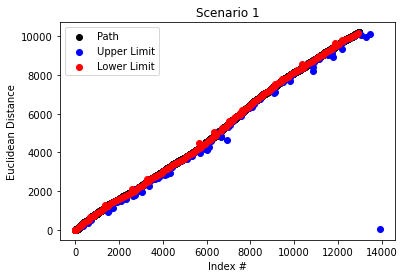

<Figure size 720x720 with 0 Axes>

In [64]:
wp = plt.scatter(wp1[0, :8070],wp1[1, :8070], c ='k', label = 'red')
up = plt.scatter(upper1[0, :8070],upper1[1, :8070], c='b', label = 'color')
low = plt.scatter(lower1[0, :8070],lower1[1, :8070], c= 'r', label = 'color')
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 1")
plt.legend((wp, up, low), ('Path', 'Upper Limit', 'Lower Limit'))

plt.show()
plt.figure(figsize=(10,10))
plt.show()

In [29]:
wp1[:,-1] - wp1[:,-2]

array([2, 1], dtype=uint32)

In [65]:
gaps1 = backtraceOffsetVert(wp1, D1, s1, parameters1, 1, 50)

374 347
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11024
13907 11

In [77]:
path_index1 = np.zeros(len(gaps1))
for i in range(path_index1.shape[0]):
    path_index1[i] = 50*i

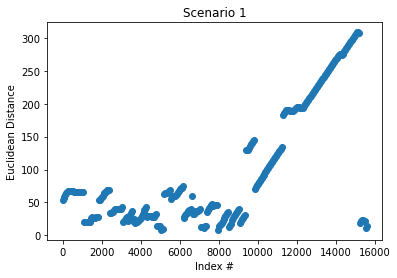

In [78]:
plt.scatter(path_index1, gaps1)
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 1")
plt.show()

In [31]:
upper2, lower2 = backtraceSimpleOffset(wp2, D2, s2, parameters2, 50)

50
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path i

A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is n

NameError: name 'upper2' is not defined

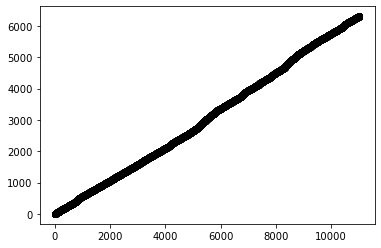

In [29]:
plt.scatter(wp2[0],wp2[1], c ='k')
plt.scatter(upper2[0],upper2[1], c= 'b')
plt.scatter(lower2[0],lower2[1],  c= 'r')
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 3")
plt.show()

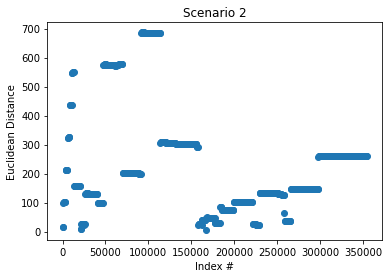

In [54]:
path_index2 = np.zeros(len(gaps2))
for i in range(path_index2.shape[0]):
    path_index2[i] = 500*i
plt.scatter(path_index2, gaps2)
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 2")
plt.show()

In [42]:
gaps3 = backtraceOffsetHor(wp3, D3, s3, parameters3, 1, 50)
path_index3 = np.zeros(len(gaps3))
for i in range(path_index3.shape[0]):
    path_index3[i] = 50*i

/home/jperez/ttmp/anaconda/envs/E207enviro/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in uint_scalars
/home/jperez/ttmp/anaconda/envs/E207enviro/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in long_scalars
/home/jperez/ttmp/anaconda/envs/E207enviro/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in sqrt


In [34]:
upper3, lower3 = backtraceSimpleOffset(wp3, D3, s3, parameters2, 50)

50
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path i

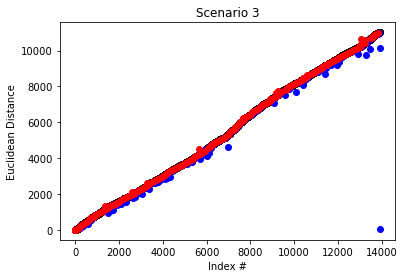

In [40]:
plt.scatter(wp3[0],wp3[1], c = 'k')
plt.scatter(upper3[0],upper3[1], c = 'b')
plt.scatter(lower3[0],lower3[1], c = 'r')
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 3")
plt.show()

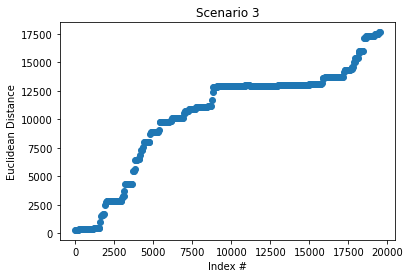

In [43]:
plt.scatter(path_index3, gaps3)
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 3")
plt.show()

In [93]:
gaps4 = backtraceOffsetHor(wp4, D4, s4, parameters4, 1, 100)

[487 862] [1125 2131]


/home/jperez/ttmp/anaconda/envs/E207enviro/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: overflow encountered in uint_scalars


[488 863] [1360 2585]
[489 864] [1362 2588]
[490 866] [1369 2601]
[491 868] [1425 2712]
[487 862] [1125 2131]
[488 863] [1360 2585]
[489 864] [1362 2588]
[490 866] [1369 2601]
[491 868] [1425 2712]
[487 862] [1125 2131]
[488 863] [1360 2585]
[489 864] [1362 2588]
[490 866] [1369 2601]
[491 868] [1425 2712]
[2192 4185] [2545 4817]
[2193 4186] [2580 4844]
[2194 4187] [2581 4845]
[2196 4188] [2613 4878]
[2197 4190] [2632 4888]
[2198 4192] [2638 4899]
[2199 4194] [2673 4917]
[2204 4197] [2679 4922]
[2205 4198] [2680 4923]
[2206 4200] [2684 4930]
[2207 4202] [2685 4931]
[2208 4204] [2689 4935]
[2209 4206] [2690 4936]
[2210 4208] [2872 5299]
[2211 4210] [2877 5308]
[2212 4212] [2878 5309]
[2213 4214] [2881 5314]
[2214 4216] [2952 5449]
[2215 4218] [2976 5496]
[2216 4220] [2987 5517]
[2217 4222] [3002 5546]
[2218 4224] [3010 5561]
[2219 4226] [3023 5586]
[2220 4228] [3146 5828]
[2221 4230] [3149 5830]
[2222 4232] [3218 5964]
[2223 4234] [3263 6038]
[2224 4236] [3381 6270]
[2225 4238] [3384 62

In [81]:
upper4, lower4 = backtraceSimpleOffset(wp4, D4, s4, parameters4, 50)

50
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path is not possible
A path i

In [82]:
lower4[:,50]


array([4294967295,         97], dtype=uint32)

In [83]:
upper4[:,50]

array([53, 97], dtype=uint32)

In [84]:
wp4[:,50]

array([52, 97], dtype=uint32)

In [85]:
D4.shape

(6310, 11024)

NameError: name 'upper4' is not defined

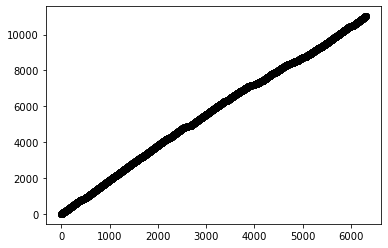

In [16]:
plt.scatter(wp4[0],wp4[1], c='k')
plt.scatter(upper4[0],upper4[1], c= 'b')
# plt.scatter(lower4[0],lower4[1], c = 'r')
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 4")
plt.show()

In [94]:
path_index4 = np.zeros(len(gaps4))
for i in range(path_index4.shape[0]):
    path_index4[i] = 100*i

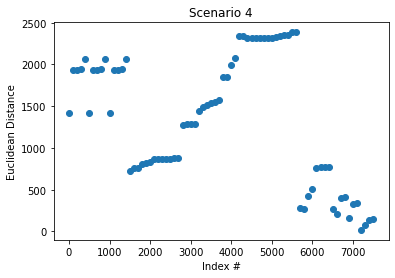

In [107]:
plt.scatter(path_index4,gaps4)
plt.xlabel("Index #")
plt.ylabel("Euclidean Distance")
plt.title("Scenario 4")
plt.show()